In [240]:
import polars as pl
import numpy as np

In [301]:
class KArmedBandit:
    def __init__(self, n_of_arms, mean, variance, epsilon, seed):
        self._n_of_arms = n_of_arms
        self._mean = mean
        self._variance = variance
        self._epsilon = epsilon
        self._seed = seed
        np.random.seed(self._seed)
        self.reset()

    def reset(self):
        self._q_fs = [0 for _ in range(self._n_of_arms)]
        self._q_icr = [0 for _ in range(self._n_of_arms)]
        self._reward_num = [0 for _ in range(self._n_of_arms)]
        self._reward_hist = []

    def select_action(self):
        if np.random.uniform() > self._epsilon:
            # print("Greedy logic")
            action = np.argmax(self._q_fs)
        else:
            # print("Random epsilon")
            action = np.random.choice(self._n_of_arms)
            # print(f"Selected action: {action}")
        return action

    def generate_reward(self, action):
        value = np.random.normal(self._mean[action], self._variance[action])
        print(f"Got value = {value}")
        return value
    
    def update_internal_state(self, action, reward):
        # update Q, reward num
        # print("Updating value")
        print(f"Previous value fs = {self._q_fs[action]}")
        print(f"Previous value iqr = {self._q_icr[action]}")
        print(f"Previous reward num = {self._reward_num[action]}")

        self._reward_num[action] += 1
        
        self._q_fs[action] = ((self._q_fs[action] * (self._reward_num[action] - 1)) + reward) / self._reward_num[action]
        
        self._q_icr[action] = self._q_icr[action] + (reward - self._q_icr[action]) / (self._reward_num[action])
        
        print(f"new_q_fs = {self._q_fs[action]}")
        print(f"new_q_iqr = {self._q_icr[action]}")
        




    def run(self, n_of_iter):
        sum_rewards = 0
        for _i in range(n_of_iter):
        
            action = self.select_action()    
            reward = self.generate_reward(action=action)
            sum_rewards += reward
            print(f"sum rewards = {sum_rewards}")
            self._reward_hist.append(sum_rewards/(_i+1))

            self.update_internal_state(action=action, reward=reward)
    
    def summarize(self):
        print("Summarize bandit")
        print("Q function and reward num:")
        print(self._q_fs)
        print(self._q_icr)
        print(self._reward_num)

In [347]:
mean = [1, 2, 10, 20, 30, 40, 50, 60, 50]
variance = [1, 1, 1, 1, 1, 1, 10, 20, 1]
n_experiments = 10000

n_exp = {'a': 0.2, 'b': 0.1, 'c': 0.01, 'd': 0}
bandits = {name: KArmedBandit(n_of_arms=9, mean=mean, variance=variance, epsilon=value, seed=42) for name, value in n_exp.items()}



In [348]:
# Run
for name, bandit in bandits.items():
    bandit.reset()
    bandit.run(n_experiments)

Got value = -0.11188011804692044
sum rewards = -0.11188011804692044
Previous value fs = 0
Previous value iqr = 0
Previous reward num = 0
new_q_fs = -0.11188011804692044
new_q_iqr = -0.11188011804692044
Got value = 66.37804369378767
sum rewards = 66.26616357574075
Previous value fs = 0
Previous value iqr = 0
Previous reward num = 0
new_q_fs = 66.37804369378767
new_q_iqr = 66.37804369378767
Got value = 67.85159500804919
sum rewards = 134.11775858378994
Previous value fs = 66.37804369378767
Previous value iqr = 66.37804369378767
Previous reward num = 1
new_q_fs = 67.11481935091842
new_q_iqr = 67.11481935091842
Got value = 41.416306661388816
sum rewards = 175.53406524517874
Previous value fs = 67.11481935091842
Previous value iqr = 67.11481935091842
Previous reward num = 2
new_q_fs = 58.54864845440856
new_q_iqr = 58.54864845440856
Got value = 48.3824373195297
sum rewards = 223.91650256470842
Previous value fs = 58.54864845440856
Previous value iqr = 58.54864845440856
Previous reward num = 

In [349]:
for _k in bandits:
    print(f"Bandit {_k} summary:")
    bandits[_k].summarize()


Bandit a summary:
Summarize bandit
Q function and reward num:
[0.869382895484825, 2.0617115984142402, 9.965168364764327, 20.02423048537834, 29.975802548104035, 40.07339712821305, 51.62843981699511, 60.015046203936784, 50.02094302341245]
[0.8693828954848243, 2.061711598414238, 9.965168364764324, 20.024230485378347, 29.975802548104017, 40.073397128213074, 51.62843981699515, 60.01504620393676, 50.02094302341243]
[240, 207, 243, 237, 232, 267, 203, 8141, 230]
Bandit b summary:
Summarize bandit
Q function and reward num:
[0.9162619371932444, 2.1755638209810297, 10.074076855901462, 19.886154989354047, 29.936775906373335, 40.114565806209065, 49.36871761834099, 60.0711669022561, 50.18494621482844]
[0.9162619371932446, 2.1755638209810315, 10.074076855901458, 19.88615498935405, 29.936775906373313, 40.11456580620908, 49.36871761834099, 60.07116690225601, 50.18494621482842]
[120, 99, 117, 120, 133, 102, 135, 9059, 115]
Bandit c summary:
Summarize bandit
Q function and reward num:
[1.05181144001485

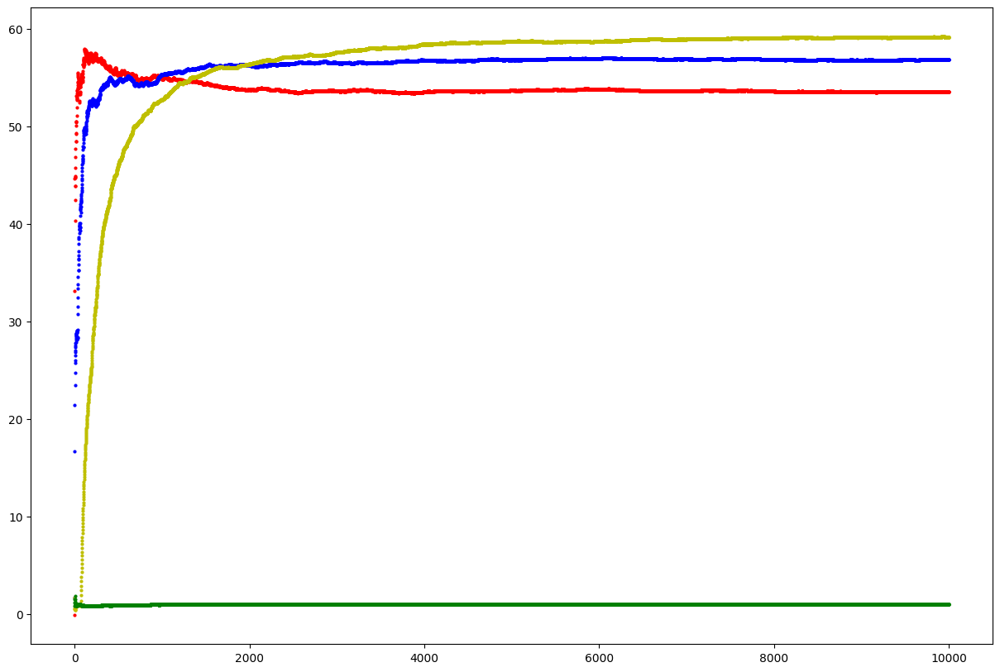

In [350]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111)
col_list = ['ro', 'bo', 'yo', 'go']
for (name, bandit), col in zip(bandits.items(), col_list):
    ax.plot(bandit._reward_hist, col, markersize=2,)

